In [1]:
import numpy as np   
import pandas as pd    
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage 
from scipy.cluster.hierarchy import fcluster
from sklearn.cluster import KMeans 
from sklearn.metrics import silhouette_score
from pandas_profiling import ProfileReport

import warnings 
warnings.filterwarnings("ignore") 

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
data = pd.read_csv("/content/drive/MyDrive/Country-data.csv") 

In [5]:
data.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200


<h4>EDA Using Pandas Profiling<h4>

In [89]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


In [90]:
profile = ProfileReport(data, title='Pandas Profiling Report', explorative=True)

In [91]:
profile.to_widgets() 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

<H3>EDA<H3>

In [6]:
data.describe(include="all") 

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
count,167,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000
unique,167,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Latvia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,38.270060,41.108976,6.815689,46.890215,17144.688623,7.781832,70.555689,2.947964,12964.155689
std,NaN,40.328931,27.412010,2.746837,24.209589,19278.067698,10.570704,8.893172,1.513848,18328.704809
min,NaN,2.600000,0.109000,1.810000,0.065900,609.000000,-4.210000,32.100000,1.150000,231.000000
25%,NaN,8.250000,23.800000,4.920000,30.200000,3355.000000,1.810000,65.300000,1.795000,1330.000000
50%,NaN,19.300000,35.000000,6.320000,43.300000,9960.000000,5.390000,73.100000,2.410000,4660.000000
75%,NaN,62.100000,51.350000,8.600000,58.750000,22800.000000,10.750000,76.800000,3.880000,14050.000000


In [7]:
data.isnull().sum()

country       0
child_mort    0
exports       0
health        0
imports       0
income        0
inflation     0
life_expec    0
total_fer     0
gdpp          0
dtype: int64

In [8]:
dups = data.duplicated()
print('Number of duplicate rows = %d' % (dups.sum())) 

Number of duplicate rows = 0


In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167 entries, 0 to 166
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   country     167 non-null    object 
 1   child_mort  167 non-null    float64
 2   exports     167 non-null    float64
 3   health      167 non-null    float64
 4   imports     167 non-null    float64
 5   income      167 non-null    int64  
 6   inflation   167 non-null    float64
 7   life_expec  167 non-null    float64
 8   total_fer   167 non-null    float64
 9   gdpp        167 non-null    int64  
dtypes: float64(7), int64(2), object(1)
memory usage: 13.2+ KB


Observation Until Now :

1. there is no missing value in column
2. And no duplicate rows found 
3. Every value is a non value

<h3>2D SCATTER PLOT<h3>

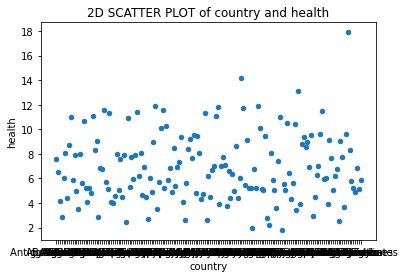

In [10]:
data.plot(kind="scatter",x="country",y="health",title="2D SCATTER PLOT of country and health")

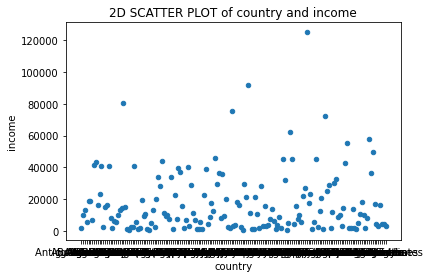

In [11]:
data.plot(kind="scatter",x="country",y="income",title="2D SCATTER PLOT of country and income")

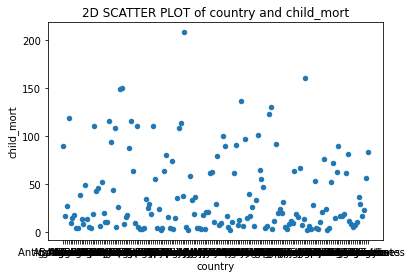

In [12]:
data.plot(kind="scatter",x="country",y="child_mort",title="2D SCATTER PLOT of country and child_mort")

Observation from 2D scatter plot

1.It make no sense from above plot since data are sCATTERED

<H3>PAIR-PLOT<H3>

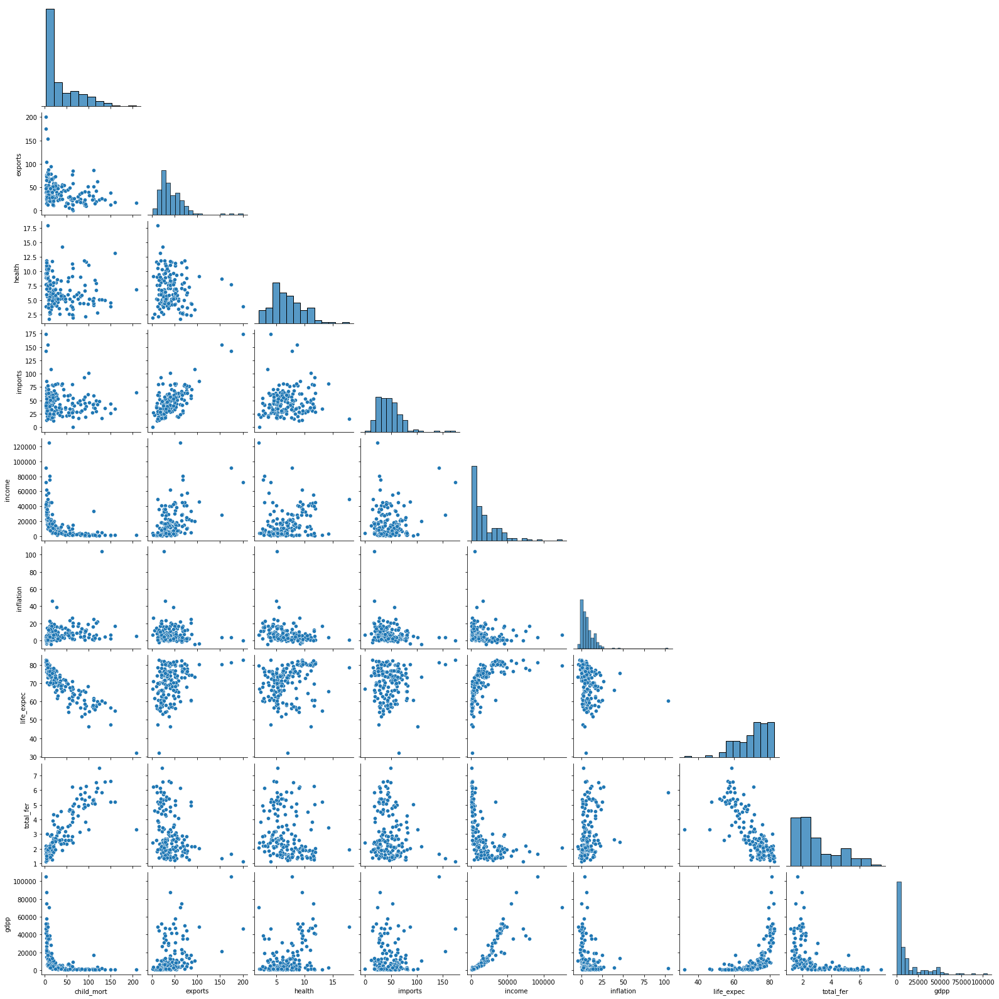

In [13]:
sns.pairplot(data,corner=True)  

1.we are unable to classify which is the most useful feature because of too much overlapping .
2. we will go with correlation for fetaure importance

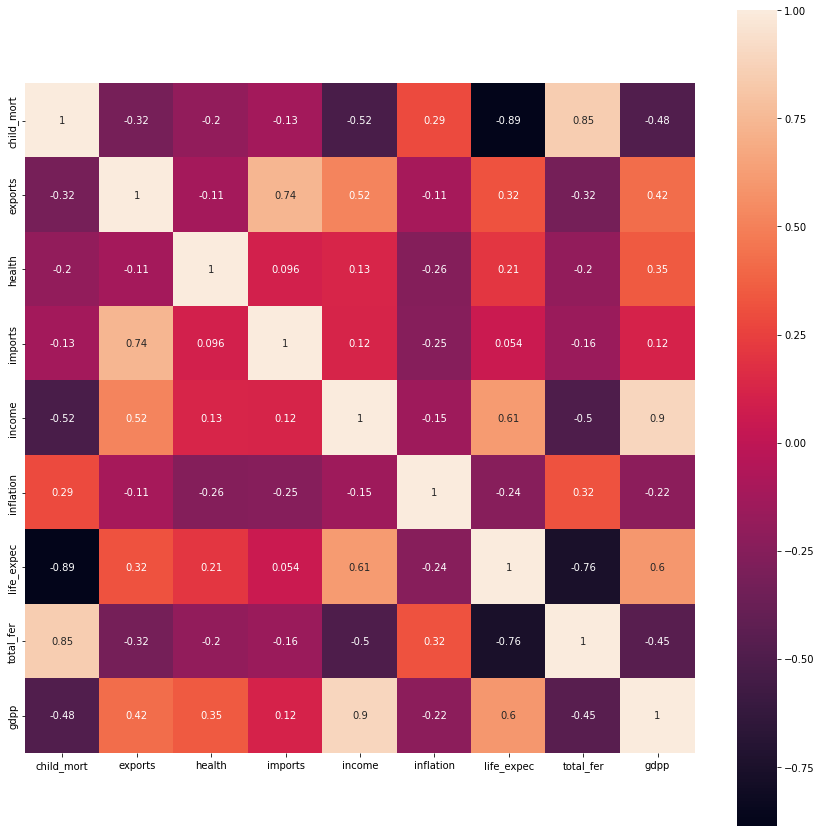

In [14]:
plt.figure(figsize=(15,15))
sns.heatmap(data.corr(),annot=True,square=True) 

In [15]:
data.corr()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
child_mort,1.000000,-0.318093,-0.200402,-0.127211,-0.524315,0.288276,-0.886676,0.848478,-0.483032
exports,-0.318093,1.000000,-0.114408,0.737381,0.516784,-0.107294,0.316313,-0.320011,0.418725
health,-0.200402,-0.114408,1.000000,0.095717,0.129579,-0.255376,0.210692,-0.196674,0.345966
imports,-0.127211,0.737381,0.095717,1.000000,0.122406,-0.246994,0.054391,-0.159048,0.115498
income,-0.524315,0.516784,0.129579,0.122406,1.000000,-0.147756,0.611962,-0.501840,0.895571
inflation,0.288276,-0.107294,-0.255376,-0.246994,-0.147756,1.000000,-0.239705,0.316921,-0.221631
life_expec,-0.886676,0.316313,0.210692,0.054391,0.611962,-0.239705,1.000000,-0.760875,0.600089
total_fer,0.848478,-0.320011,-0.196674,-0.159048,-0.501840,0.316921,-0.760875,1.000000,-0.454910
gdpp,-0.483032,0.418725,0.345966,0.115498,0.895571,-0.221631,0.600089,-0.454910,1.000000


<h3> Removing OUTLIER Points <h3>

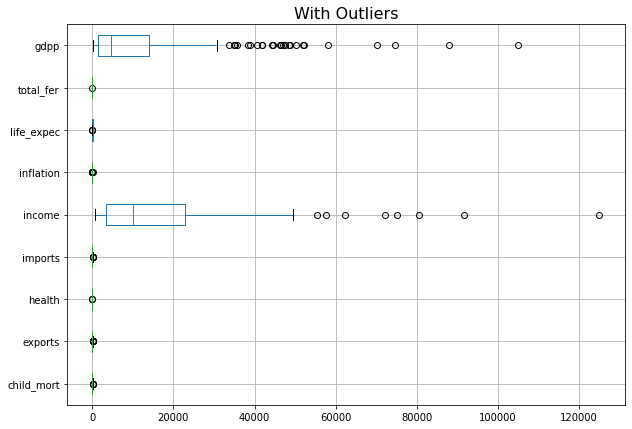

In [16]:
cont=data.dtypes[(data.dtypes!='object')].index 
plt.figure(figsize=(10,7))
data[cont].boxplot(vert=0)
plt.title('With Outliers',fontsize=16)
plt.show()  

In [17]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [18]:
for column in data[cont].columns:
    lr,ur=remove_outlier(data[column])
    data[column]=np.where(data[column]>ur,ur,data[column])
    data[column]=np.where(data[column]<lr,lr,data[column])

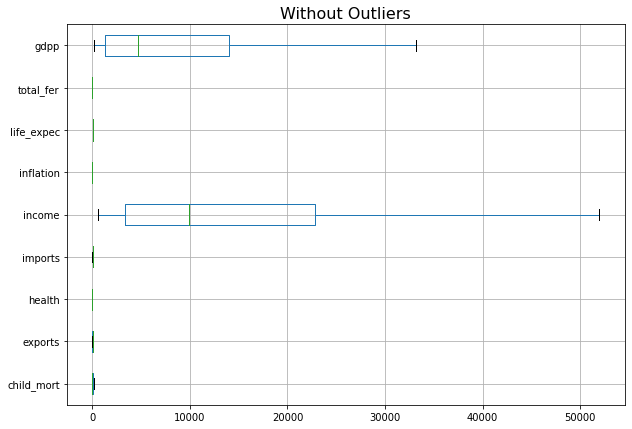

In [19]:
plt.figure(figsize=(10,7))
data[cont].boxplot(vert=0)
plt.title('Without Outliers',fontsize=16)
plt.show() 

<b> Box plot and Whiskers

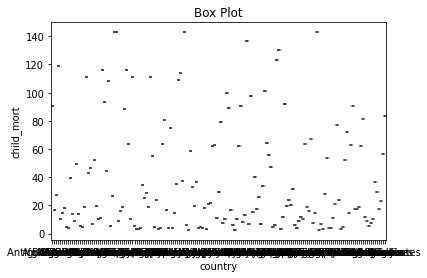

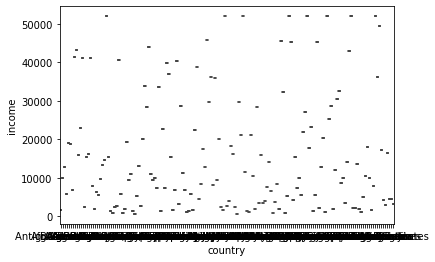

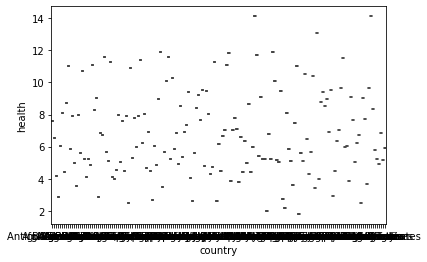

In [22]:
plt.title("Box Plot")
sns.boxplot(x="country",y="child_mort", data=data)
plt.show()
sns.boxplot(x="country",y="income", data=data)
plt.show()
sns.boxplot(x="country",y="health", data=data)
plt.show()


<b> Violin plots

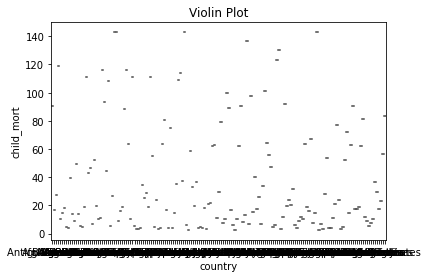

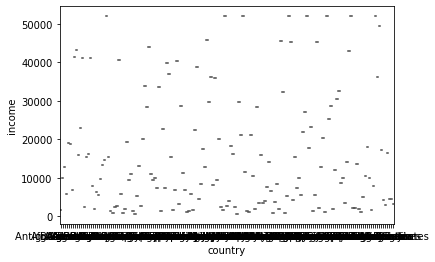

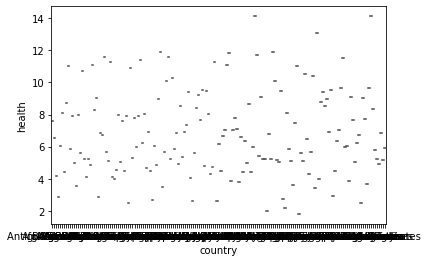

In [23]:
plt.title("Violin Plot")
sns.violinplot(x="country",y="child_mort", data=data)
plt.show()
sns.violinplot(x="country",y="income", data=data)
plt.show()
sns.violinplot(x="country",y="health", data=data)
plt.show()
 

In [25]:
from sklearn.preprocessing import LabelEncoder

LE = LabelEncoder()

In [26]:
datatemp=data.copy(deep=True)

In [27]:
datatemp['country'] = LE.fit_transform(datatemp['country'])


In [28]:
std = StandardScaler()

In [29]:
scaled_data = pd.DataFrame(std.fit_transform(datatemp),columns=datatemp.columns)

In [30]:
scaled_data.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,-1.721710,1.369802,-1.391107,0.296013,-0.047444,-0.943936,0.355270,-1.702225,1.915276,-0.846341
1,-1.700967,-0.550464,-0.543547,-0.091190,0.135021,-0.395181,-0.385208,0.663321,-0.862779,-0.540827
2,-1.680223,-0.271295,-0.053846,-0.985893,-0.713196,-0.199291,1.351551,0.686859,-0.036691,-0.508868
3,-1.659480,2.121210,1.071524,-1.482114,-0.146074,-0.660984,2.293979,-1.243238,2.141784,-0.589198
4,-1.638736,-0.714835,0.280469,-0.286671,0.642965,0.209637,-0.841463,0.722166,-0.543003,0.159686


K-Means

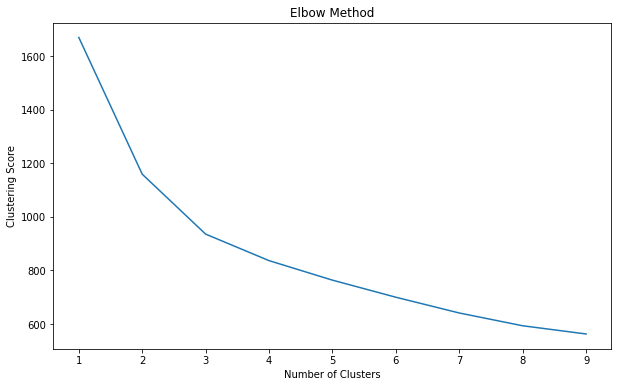

In [31]:
# individual_clustering_score is inertia 

individual_clustering_score = []
for i in range(1, 10):
    kmeans = KMeans(n_clusters = i, init = 'random', random_state = 42)
    kmeans.fit(scaled_data)
    individual_clustering_score.append(kmeans.inertia_) 
    

plt.figure(figsize=(10,6))
plt.plot(range(1, 10), individual_clustering_score)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Clustering Score')
plt.show() 

In [32]:
individual_clustering_score

[1670.0,
 1159.4193928326144,
 935.7159888891679,
 836.6730931012544,
 763.7685458812033,
 700.0084076389447,
 641.1483478197217,
 593.459971584319,
 562.7988340360107]

In [33]:
#Fit the model and predict
kmeans= KMeans(n_clusters = 3, random_state = 42)


kmeans.fit(scaled_data)

label =kmeans.labels_ 

In [34]:
label

array([2, 0, 0, 2, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 2, 0, 0, 0, 0,
       0, 1, 0, 2, 2, 0, 2, 1, 0, 2, 2, 0, 0, 0, 2, 2, 2, 0, 2, 0, 1, 1,
       1, 0, 0, 0, 0, 2, 2, 0, 0, 1, 1, 2, 2, 0, 1, 2, 1, 0, 0, 2, 2, 0,
       2, 0, 1, 0, 0, 0, 2, 1, 1, 1, 0, 1, 0, 0, 2, 2, 1, 0, 2, 0, 0, 2,
       2, 0, 0, 1, 0, 2, 2, 0, 0, 2, 1, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0,
       1, 1, 2, 2, 1, 1, 2, 0, 0, 0, 0, 0, 1, 1, 0, 0, 2, 0, 1, 2, 0, 0,
       2, 1, 1, 1, 0, 2, 1, 1, 0, 0, 2, 0, 1, 1, 0, 2, 0, 2, 2, 0, 0, 0,
       0, 2, 0, 1, 1, 1, 0, 0, 0, 0, 0, 2, 2], dtype=int32)

In [35]:
data_km=data.copy(deep=True)

In [36]:
data_km['clusters'] = label 

In [37]:
data_km.head(10) 

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,clusters
0,Afghanistan,90.2,10.0,7.58,44.9,1610.0,9.440,56.2,5.82,553.0,2
1,Albania,16.6,28.0,6.55,48.6,9930.0,4.490,76.3,1.65,4090.0,0
2,Algeria,27.3,38.4,4.17,31.4,12900.0,16.100,76.5,2.89,4460.0,0
3,Angola,119.0,62.3,2.85,42.9,5900.0,22.400,60.1,6.16,3530.0,2
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100.0,1.440,76.8,2.13,12200.0,0
5,Argentina,14.5,18.9,8.10,16.0,18700.0,20.900,75.8,2.37,10300.0,0
6,Armenia,18.1,20.8,4.40,45.3,6700.0,7.770,73.3,1.69,3220.0,0
7,Australia,4.8,19.8,8.73,20.9,41400.0,1.160,82.0,1.93,33130.0,1
8,Austria,4.3,51.3,11.00,47.8,43200.0,0.873,80.5,1.44,33130.0,1
9,Azerbaijan,39.2,54.3,5.88,20.7,16000.0,13.800,69.1,1.92,5840.0,0


In [38]:
kmeans.cluster_centers_

array([[-0.03380421, -0.4073848 ,  0.04041713, -0.17644622,  0.12167228,
        -0.29313626, -0.00203396,  0.22947068, -0.42744615, -0.37838209],
       [ 0.06542179, -0.83558735,  0.55828007,  0.61053738,  0.02238674,
         1.57719412, -0.56371353,  1.06738637, -0.75225834,  1.67515009],
       [ 0.00397216,  1.39544842, -0.53290874, -0.20252796, -0.22826676,
        -0.80354326,  0.47126763, -1.28117433,  1.36087688, -0.73791286]])

In [39]:
silhouette_score(scaled_data,label) 

0.23929271865523266

In [40]:
cluster_prof=data_km.groupby('clusters').mean()
cluster_prof['Freq']=data_km['clusters'].value_counts().sort_index()
cluster_prof 

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Freq
clusters,,,,,,,,,,
0,22.083951,40.401914,6.323210,48.329321,11477.160494,7.051469,72.613580,2.303457,5970.666667,81
1,5.671795,51.400000,8.416667,46.316026,39834.358974,3.296718,79.733333,1.815897,29744.871795,39
2,91.182979,28.225936,6.253830,41.233317,3738.574468,10.215426,59.777660,4.987819,1808.297872,47


countries which present in cluster2 is the one that needs money from HELP International NGO because the model is predicated to be less income and health report in cluster 2 and in other clusters and child_mort value seems to be higher than other 2 cluster

In [43]:
country_cluster=list(data_km[data_km['clusters']==2].country)

In [44]:
country_cluster

['Afghanistan',
 'Angola',
 'Benin',
 'Burkina Faso',
 'Burundi',
 'Cameroon',
 'Central African Republic',
 'Chad',
 'Comoros',
 'Congo, Dem. Rep.',
 'Congo, Rep.',
 "Cote d'Ivoire",
 'Equatorial Guinea',
 'Eritrea',
 'Gabon',
 'Gambia',
 'Ghana',
 'Guinea',
 'Guinea-Bissau',
 'Haiti',
 'Iraq',
 'Kenya',
 'Kiribati',
 'Lao',
 'Lesotho',
 'Liberia',
 'Madagascar',
 'Malawi',
 'Mali',
 'Mauritania',
 'Mozambique',
 'Myanmar',
 'Namibia',
 'Niger',
 'Nigeria',
 'Pakistan',
 'Rwanda',
 'Senegal',
 'Sierra Leone',
 'South Africa',
 'Sudan',
 'Tanzania',
 'Timor-Leste',
 'Togo',
 'Uganda',
 'Yemen',
 'Zambia']

K-Means++

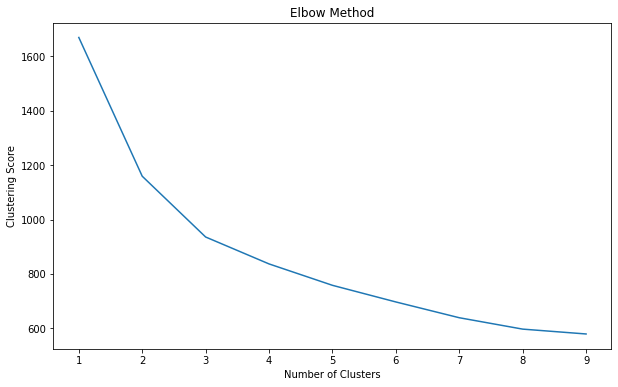

In [45]:
# individual_clustering_score is inertia 

individual_clustering_score = []
for i in range(1, 10):
    kmeansplus = KMeans(n_clusters = i, init = 'k-means++' , random_state = 42)
    kmeansplus.fit(scaled_data)
    individual_clustering_score.append(kmeansplus.inertia_) 
    

plt.figure(figsize=(10,6))
plt.plot(range(1, 10), individual_clustering_score)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Clustering Score')
plt.show() 

In [46]:
individual_clustering_score 

[1670.0,
 1159.4193928326144,
 935.7159888891679,
 836.6638188261788,
 757.9189638915498,
 696.7185650032675,
 638.6418109043038,
 596.739213729041,
 578.8765875619383]

In [47]:
#Fit the model and predict
kmeansplus= KMeans(n_clusters = 3, random_state = 42, init = 'k-means++')


kmeansplus.fit(scaled_data)

label1=kmeansplus.labels_


In [48]:
label1

array([2, 0, 0, 2, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 2, 0, 0, 0, 0,
       0, 1, 0, 2, 2, 0, 2, 1, 0, 2, 2, 0, 0, 0, 2, 2, 2, 0, 2, 0, 1, 1,
       1, 0, 0, 0, 0, 2, 2, 0, 0, 1, 1, 2, 2, 0, 1, 2, 1, 0, 0, 2, 2, 0,
       2, 0, 1, 0, 0, 0, 2, 1, 1, 1, 0, 1, 0, 0, 2, 2, 1, 0, 2, 0, 0, 2,
       2, 0, 0, 1, 0, 2, 2, 0, 0, 2, 1, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0,
       1, 1, 2, 2, 1, 1, 2, 0, 0, 0, 0, 0, 1, 1, 0, 0, 2, 0, 1, 2, 0, 0,
       2, 1, 1, 1, 0, 2, 1, 1, 0, 0, 2, 0, 1, 1, 0, 2, 0, 2, 2, 0, 0, 0,
       0, 2, 0, 1, 1, 1, 0, 0, 0, 0, 0, 2, 2], dtype=int32)

In [49]:
data_kmplus=data.copy(deep=True)

In [50]:
data_kmplus['clusters'] = label1

In [51]:
data_kmplus.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,clusters
0,Afghanistan,90.2,10.0,7.58,44.9,1610.0,9.44,56.2,5.82,553.0,2
1,Albania,16.6,28.0,6.55,48.6,9930.0,4.49,76.3,1.65,4090.0,0
2,Algeria,27.3,38.4,4.17,31.4,12900.0,16.10,76.5,2.89,4460.0,0
3,Angola,119.0,62.3,2.85,42.9,5900.0,22.40,60.1,6.16,3530.0,2
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100.0,1.44,76.8,2.13,12200.0,0


In [52]:
kmeansplus.cluster_centers_

array([[-0.03380421, -0.4073848 ,  0.04041713, -0.17644622,  0.12167228,
        -0.29313626, -0.00203396,  0.22947068, -0.42744615, -0.37838209],
       [ 0.06542179, -0.83558735,  0.55828007,  0.61053738,  0.02238674,
         1.57719412, -0.56371353,  1.06738637, -0.75225834,  1.67515009],
       [ 0.00397216,  1.39544842, -0.53290874, -0.20252796, -0.22826676,
        -0.80354326,  0.47126763, -1.28117433,  1.36087688, -0.73791286]])

In [53]:
silhouette_score(scaled_data,label1) 

0.23929271865523266

In [54]:
cluster_prof=data_kmplus.groupby('clusters').mean()
cluster_prof['Freq']=data_kmplus['clusters'].value_counts().sort_index()
cluster_prof 

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Freq
clusters,,,,,,,,,,
0,22.083951,40.401914,6.323210,48.329321,11477.160494,7.051469,72.613580,2.303457,5970.666667,81
1,5.671795,51.400000,8.416667,46.316026,39834.358974,3.296718,79.733333,1.815897,29744.871795,39
2,91.182979,28.225936,6.253830,41.233317,3738.574468,10.215426,59.777660,4.987819,1808.297872,47


countries which present in cluster2 is the one that needs money from HELP International NGO because the model is predicated to be less income and health report in cluster 2 and in other clusters and child_mort value seems to be higher than other 2 cluster


In [55]:
country_cluster=list(data_kmplus[data_kmplus['clusters']==2].country)

In [56]:
country_cluster

['Afghanistan',
 'Angola',
 'Benin',
 'Burkina Faso',
 'Burundi',
 'Cameroon',
 'Central African Republic',
 'Chad',
 'Comoros',
 'Congo, Dem. Rep.',
 'Congo, Rep.',
 "Cote d'Ivoire",
 'Equatorial Guinea',
 'Eritrea',
 'Gabon',
 'Gambia',
 'Ghana',
 'Guinea',
 'Guinea-Bissau',
 'Haiti',
 'Iraq',
 'Kenya',
 'Kiribati',
 'Lao',
 'Lesotho',
 'Liberia',
 'Madagascar',
 'Malawi',
 'Mali',
 'Mauritania',
 'Mozambique',
 'Myanmar',
 'Namibia',
 'Niger',
 'Nigeria',
 'Pakistan',
 'Rwanda',
 'Senegal',
 'Sierra Leone',
 'South Africa',
 'Sudan',
 'Tanzania',
 'Timor-Leste',
 'Togo',
 'Uganda',
 'Yemen',
 'Zambia']

**Hierarchical Clustering**

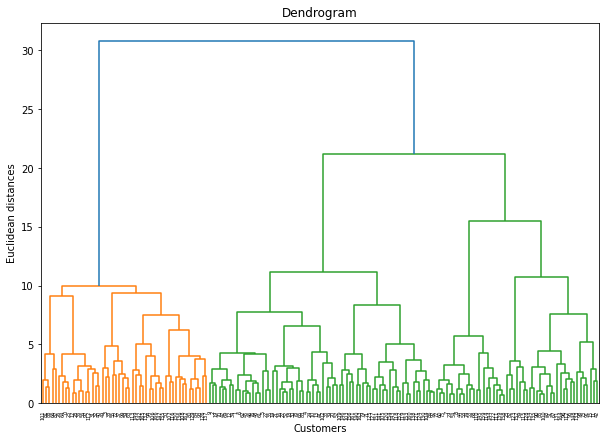

In [57]:
import scipy.cluster.hierarchy as sch
plt.figure(figsize=(10, 7))


dendrogram = sch.dendrogram(sch.linkage(scaled_data, method  = "ward"))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distances') 
plt.show()

In [58]:
from sklearn.cluster import AgglomerativeClustering
cluster = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')  
cluster.fit_predict(scaled_data)  

array([1, 0, 0, 1, 0, 0, 0, 3, 3, 0, 0, 2, 0, 0, 0, 2, 0, 1, 0, 0, 0, 0,
       0, 2, 0, 1, 1, 0, 1, 3, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 2, 2,
       3, 0, 0, 0, 0, 1, 1, 2, 0, 3, 3, 1, 1, 0, 3, 1, 3, 0, 0, 1, 1, 0,
       1, 2, 3, 0, 0, 0, 1, 2, 3, 3, 0, 3, 0, 0, 1, 1, 2, 0, 1, 2, 0, 1,
       1, 2, 2, 2, 0, 1, 1, 2, 2, 1, 2, 1, 2, 1, 0, 0, 0, 0, 1, 1, 1, 0,
       3, 3, 1, 1, 3, 2, 1, 2, 0, 0, 0, 0, 3, 2, 0, 0, 1, 0, 2, 1, 0, 2,
       1, 2, 2, 2, 1, 1, 0, 3, 0, 0, 1, 0, 3, 3, 0, 1, 2, 1, 1, 0, 0, 0,
       0, 1, 0, 2, 3, 3, 0, 0, 1, 0, 2, 1, 1])

In [59]:
cl = cluster.labels_  

In [60]:
cl

array([1, 0, 0, 1, 0, 0, 0, 3, 3, 0, 0, 2, 0, 0, 0, 2, 0, 1, 0, 0, 0, 0,
       0, 2, 0, 1, 1, 0, 1, 3, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 2, 2,
       3, 0, 0, 0, 0, 1, 1, 2, 0, 3, 3, 1, 1, 0, 3, 1, 3, 0, 0, 1, 1, 0,
       1, 2, 3, 0, 0, 0, 1, 2, 3, 3, 0, 3, 0, 0, 1, 1, 2, 0, 1, 2, 0, 1,
       1, 2, 2, 2, 0, 1, 1, 2, 2, 1, 2, 1, 2, 1, 0, 0, 0, 0, 1, 1, 1, 0,
       3, 3, 1, 1, 3, 2, 1, 2, 0, 0, 0, 0, 3, 2, 0, 0, 1, 0, 2, 1, 0, 2,
       1, 2, 2, 2, 1, 1, 0, 3, 0, 0, 1, 0, 3, 3, 0, 1, 2, 1, 1, 0, 0, 0,
       0, 1, 0, 2, 3, 3, 0, 0, 1, 0, 2, 1, 1])

In [61]:
data_acw=data.copy(deep=True) 

In [62]:
data_acw['clusters'] = cl

In [63]:
data_acw.head() 

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,clusters
0,Afghanistan,90.2,10.0,7.58,44.9,1610.0,9.44,56.2,5.82,553.0,1
1,Albania,16.6,28.0,6.55,48.6,9930.0,4.49,76.3,1.65,4090.0,0
2,Algeria,27.3,38.4,4.17,31.4,12900.0,16.10,76.5,2.89,4460.0,0
3,Angola,119.0,62.3,2.85,42.9,5900.0,22.40,60.1,6.16,3530.0,1
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100.0,1.44,76.8,2.13,12200.0,0


In [64]:
silhouette_score(scaled_data,cl)

0.21942224073956046

In [65]:
cluster_prof=data_acw.groupby('clusters').mean()
cluster_prof['Freq']=data_acw['clusters'].value_counts().sort_index()
cluster_prof 

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Freq
clusters,,,,,,,,,,
0,22.941176,34.987941,6.311471,43.539706,11170.441176,7.573941,72.733824,2.293971,6089.176471,68
1,87.658000,28.920380,6.437000,43.057318,3675.660000,9.867100,59.993000,4.912550,1842.200000,50
2,9.378571,72.184821,5.899643,65.246429,31789.107143,4.980000,76.971429,1.873929,19592.142857,28
3,4.290476,36.066667,10.387619,34.214286,39306.428571,1.525857,80.957143,1.797143,32090.952381,21


countries which present in cluster1 is the one that needs money from HELP International NGO because the model is predicated to be less income and export , life_expec report in cluster 1 and in other clusters and gdpp value seems to be less than other 2 cluster


In [66]:
country_cluster2=list(data_acw[data_acw['clusters']==1].country) 

In [67]:
country_cluster2 

['Afghanistan',
 'Angola',
 'Benin',
 'Burkina Faso',
 'Burundi',
 'Cameroon',
 'Central African Republic',
 'Chad',
 'Comoros',
 'Congo, Dem. Rep.',
 'Congo, Rep.',
 "Cote d'Ivoire",
 'Equatorial Guinea',
 'Eritrea',
 'Gabon',
 'Gambia',
 'Ghana',
 'Guinea',
 'Guinea-Bissau',
 'Haiti',
 'Iraq',
 'Kenya',
 'Kiribati',
 'Lao',
 'Lesotho',
 'Liberia',
 'Madagascar',
 'Malawi',
 'Mali',
 'Mauritania',
 'Micronesia, Fed. Sts.',
 'Mozambique',
 'Myanmar',
 'Namibia',
 'Niger',
 'Nigeria',
 'Pakistan',
 'Rwanda',
 'Senegal',
 'Sierra Leone',
 'Solomon Islands',
 'South Africa',
 'Sudan',
 'Tanzania',
 'Timor-Leste',
 'Togo',
 'Uganda',
 'Vanuatu',
 'Yemen',
 'Zambia']

In [68]:
from sklearn.cluster import AgglomerativeClustering
cluster = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='single')  
cluster.fit_predict(scaled_data)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [69]:
cl2 = cluster.labels_ 

In [70]:
cl2

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [71]:
data_acs=data.copy(deep=True) 

In [72]:
data_acs['clusters'] = cl2

In [73]:
data_acs.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,clusters
0,Afghanistan,90.2,10.0,7.58,44.9,1610.0,9.44,56.2,5.82,553.0,0
1,Albania,16.6,28.0,6.55,48.6,9930.0,4.49,76.3,1.65,4090.0,0
2,Algeria,27.3,38.4,4.17,31.4,12900.0,16.10,76.5,2.89,4460.0,0
3,Angola,119.0,62.3,2.85,42.9,5900.0,22.40,60.1,6.16,3530.0,0
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100.0,1.44,76.8,2.13,12200.0,0


In [74]:
silhouette_score(scaled_data,cl2) 

0.047375471798724644

In [75]:
cluster_prof=data_acs.groupby('clusters').mean()
cluster_prof['Freq']=data_acs['clusters'].value_counts().sort_index()
cluster_prof 

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Freq
clusters,,,,,,,,,,
0,36.751982,39.076213,6.788902,45.51214,15875.506098,6.96778,70.802134,2.922241,10368.079268,164
1,14.400000,92.675000,3.400000,101.57500,20400.000000,-4.21000,73.400000,2.170000,10800.000000,1
2,142.875000,16.800000,13.100000,34.50000,1220.000000,17.20000,55.000000,5.200000,399.000000,1
3,111.000000,85.800000,4.480000,58.90000,33700.000000,24.16000,60.900000,5.210000,17100.000000,1


By looking at silhouette score we can understand model is performing terribly wrong for this parameter and almost every country clustered in 0th cluster

In [76]:
from sklearn.cluster import AgglomerativeClustering
cluster = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='average')  
cluster.fit_predict(scaled_data) 

array([2, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0,
       0, 0, 0, 2, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 2, 3, 0, 2, 0, 0, 0,
       0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 2, 0,
       2, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2,
       2, 0, 0, 1, 0, 2, 2, 0, 0, 2, 1, 3, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0,
       0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 1,
       2, 1, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0,
       2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2])

In [77]:
cl3 = cluster.labels_ 

In [78]:
cl3

array([2, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0,
       0, 0, 0, 2, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 2, 3, 0, 2, 0, 0, 0,
       0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 2, 0,
       2, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2,
       2, 0, 0, 1, 0, 2, 2, 0, 0, 2, 1, 3, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0,
       0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 1,
       2, 1, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0,
       2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2])

In [79]:
data_aca=data.copy(deep=True) 

In [80]:
data_aca['clusters'] = cl3

In [81]:
data_aca.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,clusters
0,Afghanistan,90.2,10.0,7.58,44.9,1610.0,9.44,56.2,5.82,553.0,2
1,Albania,16.6,28.0,6.55,48.6,9930.0,4.49,76.3,1.65,4090.0,0
2,Algeria,27.3,38.4,4.17,31.4,12900.0,16.10,76.5,2.89,4460.0,0
3,Angola,119.0,62.3,2.85,42.9,5900.0,22.40,60.1,6.16,3530.0,3
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100.0,1.44,76.8,2.13,12200.0,0


In [82]:
silhouette_score(scaled_data,cl3)

0.16920387063289133

cluster profiling

In [83]:
clusterprof=data_aca.groupby('clusters').mean()
clusterprof['Freq']=data_aca['clusters'].value_counts().sort_index()
clusterprof

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Freq
clusters,,,,,,,,,,
0,18.379310,40.806716,6.860172,43.660051,19865.215517,6.439371,74.647414,2.194138,13074.000000,116
1,6.200000,92.675000,6.594000,98.560000,39667.000000,-0.005200,79.620000,1.672000,26258.000000,5
2,89.078571,26.736190,6.938333,44.854762,2573.642857,8.256310,59.382143,4.943988,1338.571429,42
3,97.825000,70.975000,3.550000,54.425000,12027.500000,21.540000,62.400000,5.325000,6142.500000,4


In [87]:
country_cluster3=list(data_acw[data_acw['clusters']==2].country) 

In [88]:
country_cluster3

['Bahrain',
 'Belgium',
 'Brunei',
 'Cyprus',
 'Czech Republic',
 'Estonia',
 'Hungary',
 'Ireland',
 'Kuwait',
 'Latvia',
 'Libya',
 'Lithuania',
 'Luxembourg',
 'Malaysia',
 'Maldives',
 'Malta',
 'Mauritius',
 'Oman',
 'Panama',
 'Qatar',
 'Saudi Arabia',
 'Seychelles',
 'Singapore',
 'Slovak Republic',
 'Slovenia',
 'Thailand',
 'United Arab Emirates',
 'Vietnam']

countries which present in cluster2 is the one that needs money from HELP International NGO because the model is predicated to be less income and life_expec report in cluster 2 and in other clusters and child_mort value seems to be higher than other 2 cluster
